<a href="https://colab.research.google.com/github/BrunoBerval/dio_project5/blob/main/ReconhecimentoFacial.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Reconhecimento Facial

Neste projeto, implementamos um sistema de reconhecimento facial eficiente utilizando as bibliotecas OpenCV e face_recognition no ambiente Google Colab. O objetivo é identificar rostos em imagens de teste e compará-los com uma base de personagens conhecidos, previamente armazenados e codificados. Para facilitar o acesso aos dados, montamos o Google Drive, onde as imagens dos personagens e as imagens de teste são armazenadas.

Uma vez que os rostos são localizados, o próximo passo é a codificação. Utilizamos face_recognition para gerar vetores de 128 dimensões que representam as características únicas de cada rosto. Esses vetores são comparados com as codificações previamente geradas dos personagens conhecidos. Quando uma correspondência é encontrada, o nome do personagem correspondente é exibido junto ao rosto detectado na imagem.



---
#Facial Recognition

In this project, we implemented an efficient facial recognition system using the OpenCV and face_recognition libraries in the Google Colab environment. The goal is to identify faces in test images and compare them with a database of known characters, previously stored and encoded. To facilitate data access, we mounted Google Drive, where the character images and test images are stored.

Once the faces are located, the next step is encoding. We use face_recognition to generate 128-dimensional vectors that represent the unique features of each face. These vectors are compared with the previously generated encodings of the known characters. When a match is found, the corresponding character's name is displayed alongside the detected face in the image.


In [ ]:
!pip install face_recognition
!apt-get install -y libgl1-mesa-glx

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.1/100.1 MB 8.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for face-recognition-models: filename=face_recognition_models-0.3.0-py2.py3-none-any.whl size=100566162 sha256=d80f3a3bf0235f5eb4baf59004d7c44c3e813d1151eb81c9444f945701ebe8a3
  Stored in directory: /root/.cache/pip/wheels/04/52/ec/9355da79c29f160b038a20c784db2803c2f9fa2c8a462c176a
Successfully built face-recognition-models
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following NEW packages will be installed:
  libgl1-mesa-glx
0 upgraded, 1 newly installed, 0 to remove and 49 not upgraded.
Need to get 5,584 B of archives.
After this operation, 74.8 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy-updates/universe amd64 libgl1-mesa-glx amd64 23.0.4-0ubuntu1~22.04.1 [5,584 B]
Fetched 5,584 B in 0s (13.7 kB/s)
Selecting previously unselected package libgl1-mes

In [ ]:
import cv2
import face_recognition as fr
import numpy as np
import os

In [ ]:
from google.colab import drive
from google.colab.patches import cv2_imshow

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Neste projeto nós iremos estar realizando o reconhecimento facial de alguns personagens do famoso seriado The Office. Para exemplo iremos carregar a imagem de um personagem utilizando a biblioteca OpenCV.
Esta célula carrega a imagem de Pam a partir do Google Drive, converte o formato de cor da imagem de BGR para RGB, e exibe a imagem no Google Colab usando cv2_imshow.



---

In this project, we will be performing facial recognition of some characters from the famous TV show The Office. As an example, we will load an image of a character using the OpenCV library.
This cell loads the image of Pam from Google Drive, converts the color format of the image from BGR to RGB, and displays the image in Google Colab using cv2_imshow.

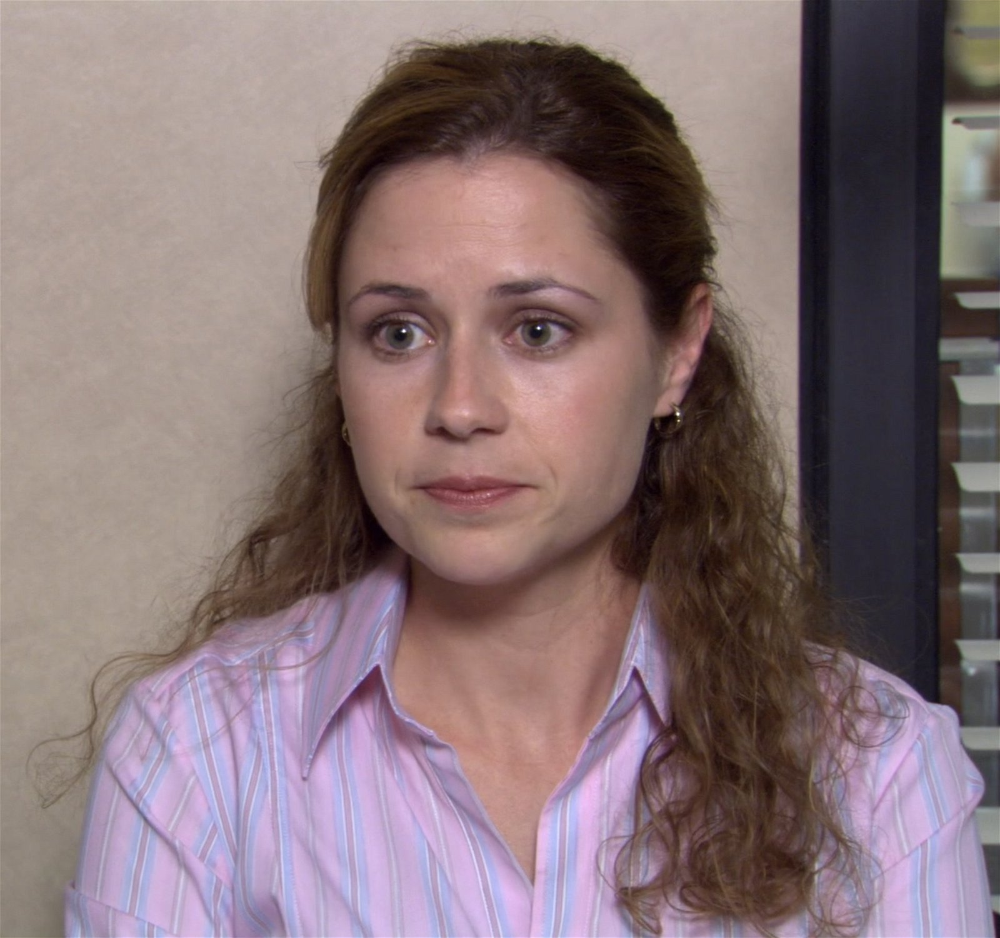

In [ ]:
img_pam = fr.load_image_file('/content/drive/MyDrive/Face_Recognition/characters/pam.jpg')
img_pam = cv2.cvtColor(img_pam, cv2.COLOR_BGR2RGB)  # Certifique-se de que a imagem esteja no formato correto
cv2_imshow(img_pam)


In [ ]:
# Codificar o rosto de Pam
encode_pam = fr.face_encodings(img_pam)[0]

print(encode_pam)

[-0.02581029  0.06944762  0.05605464 -0.05270744 -0.1161931   0.07296745
 -0.08276519 -0.10311594  0.18451993 -0.1072249   0.1894239   0.00262504
 -0.30431595  0.04660845 -0.0190239   0.23584738 -0.16112594 -0.20539057
 -0.13113369 -0.00918084 -0.11250694  0.07047388  0.10177197  0.01293907
 -0.10293349 -0.40795153 -0.06461671 -0.13797405  0.00742879 -0.07808203
  0.00367977  0.05397402 -0.17779538 -0.00577332  0.0720306   0.10377774
 -0.16982754 -0.15056553  0.23027983  0.04992035 -0.22330964 -0.01785852
  0.05038521  0.24574856  0.25398874  0.00752033  0.09924436 -0.10798648
  0.13034362 -0.42950094  0.03403461  0.08851354  0.02378704  0.14938609
  0.06646931 -0.15332825  0.06213778  0.19007167 -0.22312173  0.0944702
  0.09770537 -0.02712639 -0.01045115 -0.0334205   0.34469971  0.13971108
 -0.16073416 -0.12363613  0.17227106 -0.18714431 -0.06373628  0.11314806
 -0.08922634 -0.23399916 -0.23795249 -0.01242839  0.38531357  0.16517162
 -0.131272    0.01236426 -0.05111815  0.0076222  -0.

##Como funciona o reconhecimento facial?

**O que o código faz:**

`fr.face_encodings(img_pam):`

Esta função da biblioteca face_recognition é utilizada para extrair características únicas (ou embeddings) de uma imagem facial. Ela transforma a imagem de Pam (img_pam) em um vetor numérico que representa as características faciais exclusivas da pessoa.
[0]:

A função face_encodings retorna uma lista de vetores de características, um para cada rosto detectado na imagem. Como a imagem img_pam contém apenas o rosto de Pam, o código acessa o primeiro elemento da lista com [0] para obter o vetor correspondente ao rosto dela.
`print(encode_pam):`

Esta linha imprime o vetor de características (embedding) do rosto de Pam. O vetor contém valores numéricos que representam as características faciais de Pam em uma forma que o computador pode usar para comparações e reconhecimento.

```
Saída (output):

[-0.02581029  0.06944762  0.05605464 -0.05270744 -0.1161931   0.07296745
 ... (continua)
  0.01809755  0.04838591]

```



Este vetor de 128 dimensões representa a assinatura facial de Pam. Cada valor no vetor corresponde a uma característica específica do rosto, como o formato do nariz, a distância entre os olhos, a largura da boca, etc.

**Como o Algoritmo Usa o HOG e Embeddings:**
O HOG (Histogram of Oriented Gradients) é um método usado para detectar objetos em imagens, especialmente rostos, analisando os padrões de gradientes de intensidade (mudanças de cor) nas diferentes direções. Ele divide a imagem em pequenas células, calcula os gradientes em cada uma e cria um histograma que descreve a orientação desses gradientes. Isso ajuda a identificar características importantes, como bordas, que são essenciais para detectar rostos e outros objetos.

O HOG é usado para localizar rostos na imagem. Ele identifica regiões que provavelmente contenham rostos, baseando-se nos gradientes de intensidade de pixel.

**Cálculo de Embeddings:**

Após a detecção, o algoritmo calcula um vetor de características (embedding) para cada rosto detectado. Este vetor é calculado a partir de uma rede neural treinada para codificar faces em um espaço de características de 128 dimensões.

**Comparação de Embeddings:**

Para reconhecer Pam em outras imagens ou vídeos, o algoritmo compara o vetor encode_pam com os vetores de outros rostos detectados. Ele usa métricas como a distância Euclidiana para medir a similaridade entre os embeddings. Se a distância for pequena o suficiente, o rosto é reconhecido como sendo o de Pam.

**Eficiência do Uso de Embeddings:**

Uma vez que os embeddings são calculados, a comparação de rostos é rápida e eficiente, pois se resume a calcular a distância entre dois vetores de 128 dimensões, sem a necessidade de realização de treinamento intensivo com uma base de dados extensa.
Este vetor encode_pam serve como uma "impressão digital" facial que permite ao algoritmo reconhecer Pam em novas imagens ou vídeos com alta precisão e eficiência.



---

##How does facial recognition work?

**What the code does:**

`fr.face_encodings(img_pam):`

This function from the face_recognition library is used to extract unique features (or embeddings) from a facial image. It transforms Pam's image (img_pam) into a numerical vector that represents the unique facial features of the person.
[0]:

The face_encodings function returns a list of feature vectors, one for each face detected in the image. Since the img_pam image contains only Pam's face, the code accesses the first element of the list with [0] to get the vector corresponding to her face.
print(encode_pam):

This line prints the feature vector (embedding) of Pam's face. The vector contains numerical values that represent Pam's facial features in a form that the computer can use for comparisons and recognition.

```
(output):

[-0.02581029  0.06944762  0.05605464 -0.05270744 -0.1161931   0.07296745
 ... (continues)
  0.01809755  0.04838591]

```
This 128-dimensional vector represents Pam's facial signature. Each value in the vector corresponds to a specific facial feature, such as the shape of the nose, the distance between the eyes, the width of the mouth, etc.

**How the Algorithm Uses HOG and Embeddings:**

HOG (Histogram of Oriented Gradients) is a method used to detect objects in images, especially faces, by analyzing intensity gradient patterns (changes in color) in different directions. It divides the image into small cells, calculates the gradients in each one, and creates a histogram that describes the orientation of these gradients. This helps identify important features, like edges, that are crucial for detecting faces and other objects.

HOG is used to locate faces in the image. It identifies regions that are likely to contain faces, based on the pixel intensity gradients.

**Embedding Calculation:**

After detection, the algorithm calculates a feature vector (embedding) for each detected face. This vector is calculated from a neural network trained to encode faces into a 128-dimensional feature space.

**Embedding Comparison:**

To recognize Pam in other images or videos, the algorithm compares the vector encode_pam with vectors of other detected faces. It uses metrics like Euclidean distance to measure the similarity between embeddings. If the distance is small enough, the face is recognized as Pam's.

**Efficiency of Using Embeddings:**

Once the embeddings are calculated, face comparison is fast and efficient, as it boils down to calculating the distance between two 128-dimensional vectors, without the need for intensive training with a large database.
This vector encode_pam serves as a "facial fingerprint" that allows the algorithm to recognize Pam in new images or videos with high accuracy and efficiency.

Caminho para acessar as imagens dos personagens que deverão ser reconhecidos

E caminho para as imagens em que serão realizados os testes



---
Path to access images of characters that should be recognized

And path to the images where the tests will be carried out


In [ ]:
# Caminhos
characters_path = '/content/drive/MyDrive/Face_Recognition/characters/'
test_images_path = '/content/drive/MyDrive/Face_Recognition/test/images/'

Realizando o encoding para extrair as características dos rostos de todos os personagens salvos no Drive



---
Performing encoding to extract the features of the faces of all characters saved in Drive


In [ ]:
# Carregar imagens e codificções de personagens conhecidos
known_face_encodings = []
known_face_names = []

for file_name in os.listdir(characters_path):
    if file_name.endswith(('.jpg', '.png')):
        image_path = os.path.join(characters_path, file_name)
        character_name = os.path.splitext(file_name)[0]

        img_character = fr.load_image_file(image_path)
        img_character = cv2.cvtColor(img_character, cv2.COLOR_BGR2RGB)
        encoding = fr.face_encodings(img_character)[0]

        known_face_encodings.append(encoding)
        known_face_names.append(character_name)


Função para realizar a comparação dos embeddings extraídos rostos dos personagens de interesse com os rostos identificados nas imagens de teste.



---

Function to compare the embeddings extracted from the faces of the characters of interest with the faces identified in the test images.

In [ ]:
# Função para processar e mostrar imagens de teste
def process_test_image(image_path):
    group_image = fr.load_image_file(image_path)
    group_image = cv2.cvtColor(group_image, cv2.COLOR_BGR2RGB)

    face_locations = fr.face_locations(group_image)
    face_encodings = fr.face_encodings(group_image, face_locations)

    for (top, right, bottom, left), face_encoding in zip(face_locations, face_encodings):
        matches = fr.compare_faces(known_face_encodings, face_encoding)
        name = "Unknown"

        if True in matches:
            first_match_index = matches.index(True)
            name = known_face_names[first_match_index]

            # Desenhar um bounding box ao redor do rosto
            cv2.rectangle(group_image, (left, top), (right, bottom), (0, 255, 0), 2)

            # Adicionar uma etiqueta com o nome abaixo do rosto
            cv2.rectangle(group_image, (left, bottom - 35), (right, bottom), (0, 255, 0), cv2.FILLED)
            font = cv2.FONT_HERSHEY_DUPLEX
            cv2.putText(group_image, name, (left + 6, bottom - 6), font, 1.0, (255, 255, 255), 1)

    cv2_imshow(group_image)

Exibição dos resultados



---

Displaying results

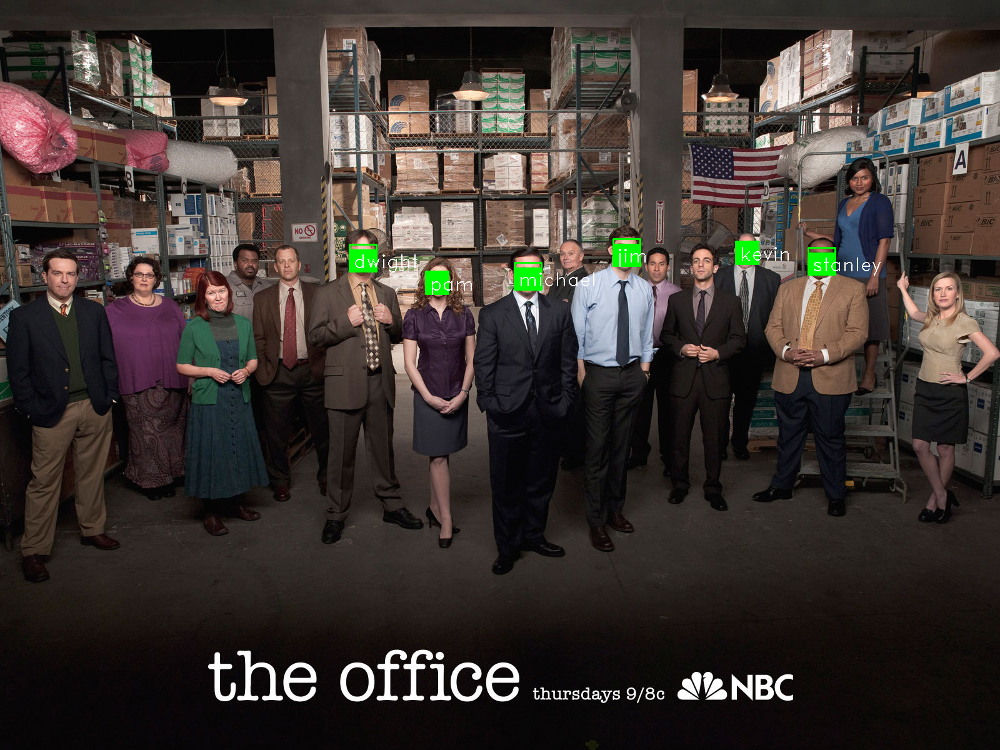

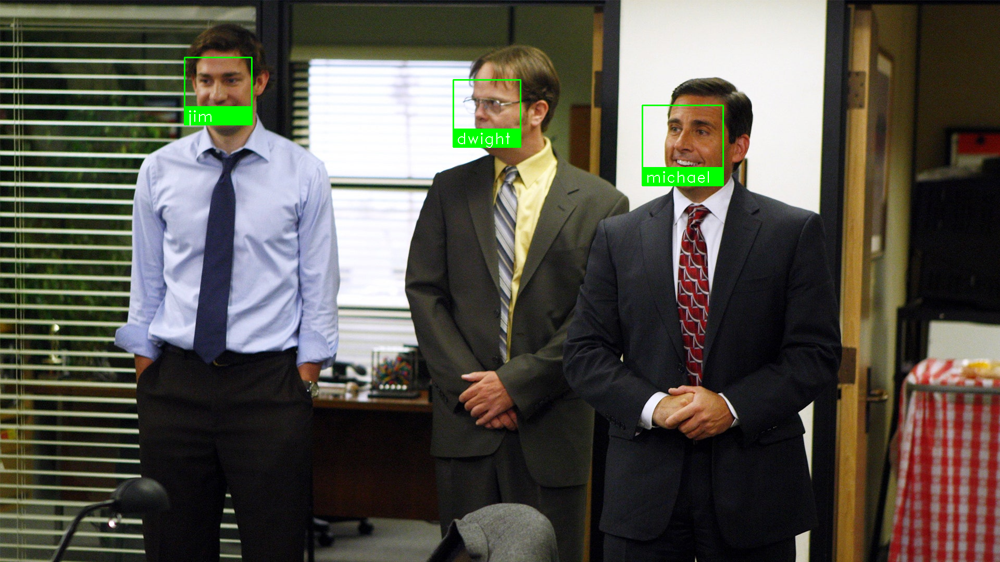

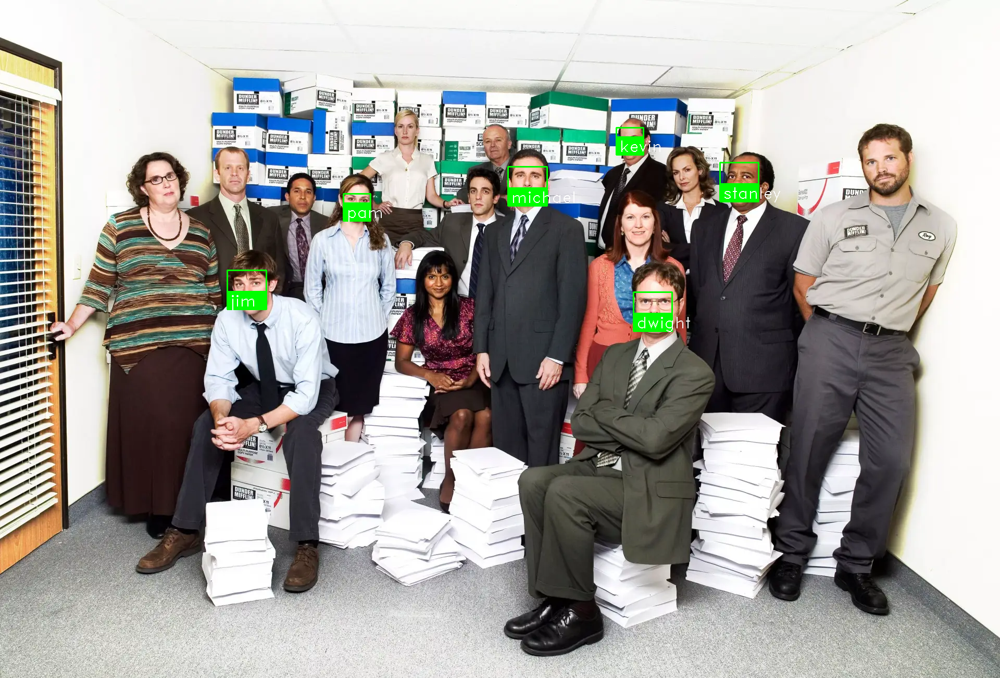

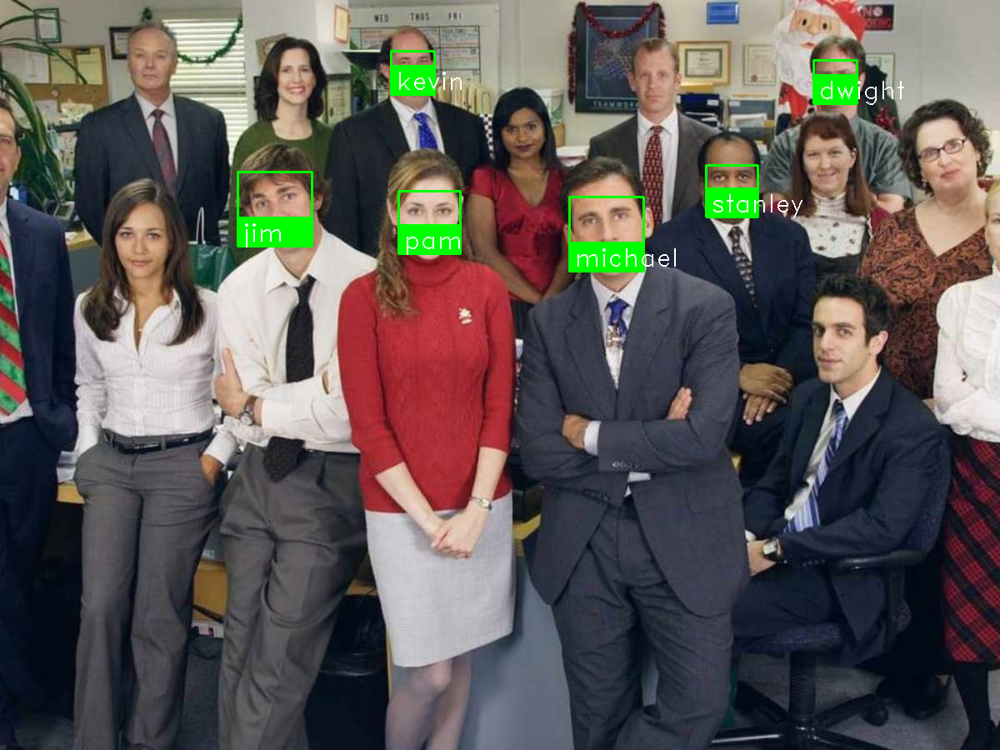

In [ ]:
# Processar e mostrar todas as imagens de teste
for test_image in os.listdir(test_images_path):
    if test_image.endswith(('.jpg', '.png')):
        image_path = os.path.join(test_images_path, test_image)
        process_test_image(image_path)